### Import Libraries

In [1]:
% matplotlib inline
import skimage
print(skimage.__version__)
import numpy as np
from PIL import Image, ImageFont, ImageDraw
from PIL.ImageChops import add, subtract, multiply, difference, screen
from PIL.ImageStat import Stat
from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection
from skimage import color, viewer, exposure, img_as_float, data
from skimage.transform import SimilarityTransform, warp, swirl
from skimage.util import invert, random_noise, montage
import matplotlib.image as mpimg
import matplotlib.pylab as plt
from scipy.ndimage import affine_transform, zoom
from scipy import misc
import os
import shutil

0.15.0


/usr/local/lib/python3.6/dist-packages/skimage/viewer/__init__.py:6: UserWarning: Viewer requires Qt
  warn('Viewer requires Qt')


### Reading, Saving and Displaying an image Using PIL

In [2]:
image = Image.open('./Images/parrot.png')
print(image.width, image.height, image.mode, image.format , type(image) )
image.show()

453 340 RGB PNG <class 'PIL.PngImagePlugin.PngImageFile'>


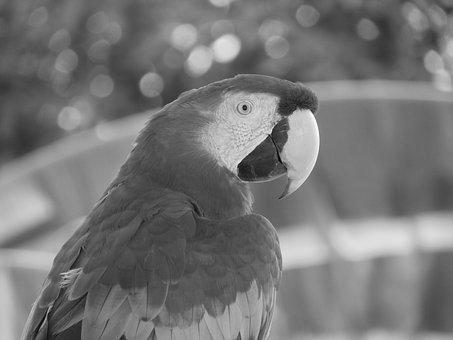

In [3]:
image_gray = image.convert('L')
image_gray.save('./Images/Parrot_gray.jpg')
Image.open('./Images/Parrot_gray.jpg')

### Reading, Saving and Displaying an image Using matplotlib

(960, 1280, 4) float32 <class 'numpy.ndarray'>


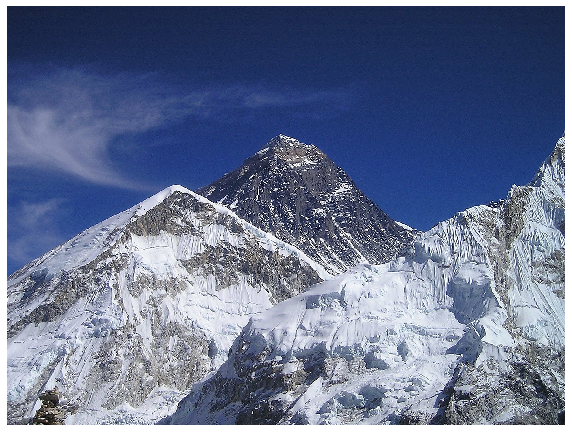

In [4]:
image = mpimg.imread('./Images/hill.png')
print(image.shape, image.dtype, type(image))
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.show()

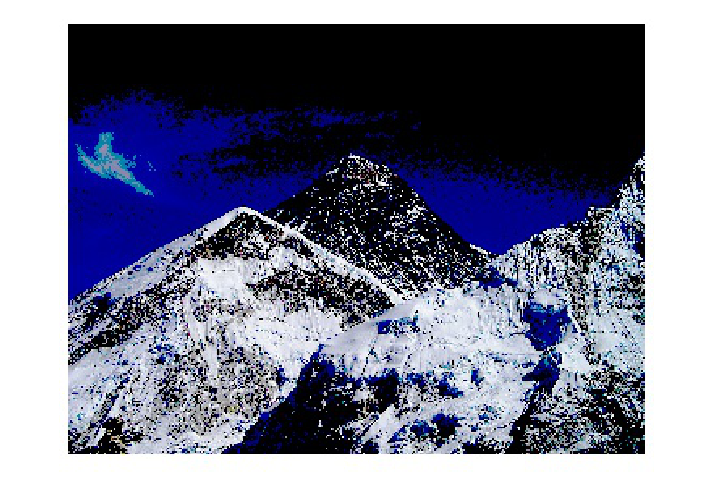

In [5]:
image1 = image
image1[image1 < 0.5]=0 
plt.imshow(image1)
plt.axis('off')
plt.tight_layout()
plt.savefig('./Images/hill_dark.jpg') 
plt.close()
image = mpimg.imread('./Images/hill_dark.jpg') 
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.tight_layout()
plt.show()

### Interpolating while displaying with matplotlib imshow

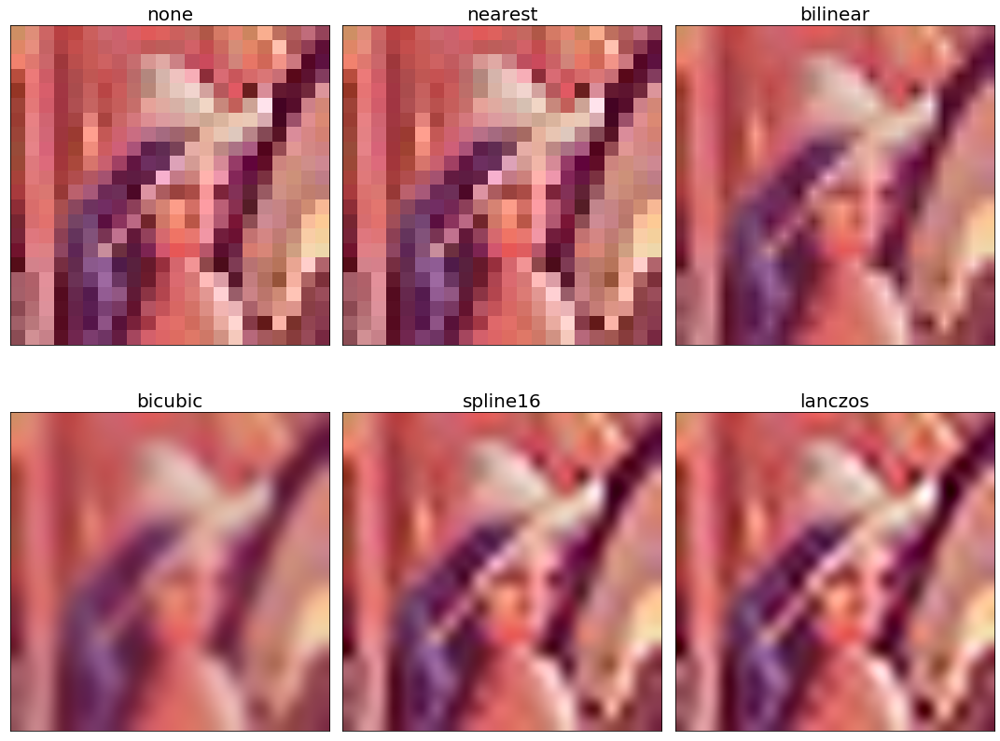

In [6]:
image = mpimg.imread("Images/lena_small.jpg")
methods = ['none', 
           'nearest', 
           'bilinear', 
           'bicubic', 
           'spline16', 
           'lanczos']

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 12), subplot_kw={'xticks': [], 'yticks': []})
fig.subplots_adjust(hspace=0.05, wspace=0.05)
for ax, interp_method in zip(axes.flat, methods):
    ax.imshow(image, interpolation=interp_method)
    ax.set_title(str(interp_method), size=20)
plt.tight_layout()
plt.show()

### Reading, saving, and displaying an image using scikit-image

(340, 453, 3) uint8 <class 'imageio.core.util.Array'>


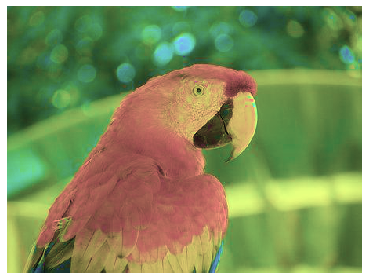

((0.0, 1.0, 0.0, 1.0), <matplotlib.image.AxesImage at 0x7ff452f60a20>, None)

In [7]:
image = imread("./Images/parrot.png") 
print(image.shape, image.dtype, type(image))
hsv = color.rgb2hsv(image) 
hsv[:, :, 1] = 0.5 
image1 = color.hsv2rgb(hsv) 
imsave('./Images/parrot_hsv.png', image1) 
image = imread("./Images/parrot_hsv.png")
plt.axis('off'), imshow(image), show()

### Using scikit-image's astronaut dataset

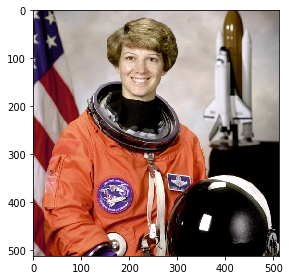

(<matplotlib.image.AxesImage at 0x7ff452f293c8>, None)

In [8]:
image = data.astronaut()
imshow(image), show()

### Using scipy.misc's face dataset

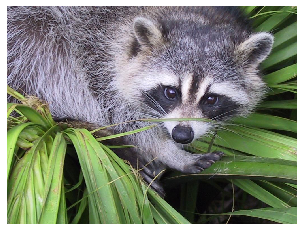

(<matplotlib.image.AxesImage at 0x7ff452e8dcf8>,
 (-0.5, 1023.5, 767.5, -0.5),
 None)

In [9]:
image = misc.face()
Image.fromarray(image).save('./Images/face.png')
plt.imshow(image), plt.axis('off'), plt.show()

In [10]:
image = Image.open('./Images/pepper.jpg')
image = np.array(image)
print(type(image), image.shape, image.dtype)

<class 'numpy.ndarray'> (225, 225, 3) uint8


<class 'imageio.core.util.Array'> (225, 225, 3) uint8


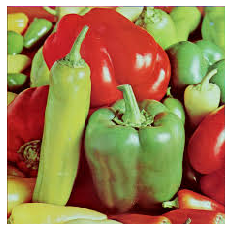

(<matplotlib.image.AxesImage at 0x7ff452e4ff28>,
 (-0.5, 224.5, 224.5, -0.5),
 None)

In [11]:
import imageio
image = imageio.imread('./Images/pepper.jpg')
print(type(image), image.shape, image.dtype)
plt.imshow(image), plt.axis('off'), plt.show()

### Converting from one file format to another

In [12]:
image = Image.open("./Images/parrot.png")
print(image.mode)
image.save("./Images/parrot.jpg")

RGB


In [13]:
image = Image.open("./Images/hill.png")
print(image.mode)
image.convert('RGB').save("./Images/hill.jpg") 

RGBA


### Converting from one image mode into another

(340, 453, 3)


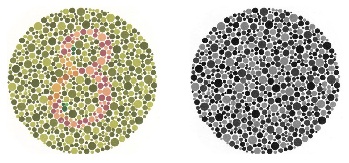

In [14]:
image = imread("./Images/parrot.png", as_gray=False)
print(image.shape)
image = imread("./Images/Ishihara.png")
image_gray = color.rgb2gray(image)
plt.subplot(121), plt.imshow(image, cmap='gray'), plt.axis('off')
plt.subplot(122), plt.imshow(image_gray, cmap='gray'), plt.axis('off')
plt.show()

### Converting from one color space into another

<Figure size 432x288 with 0 Axes>

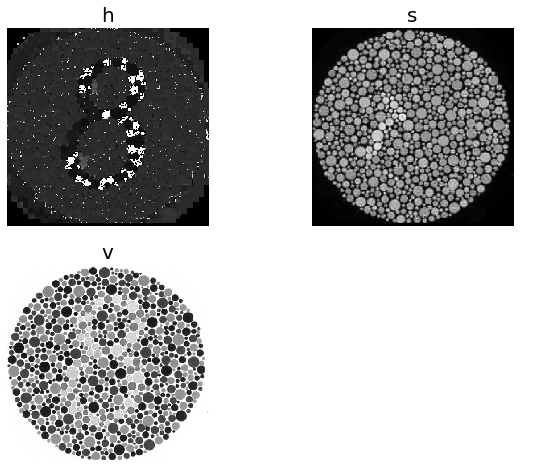

In [15]:
imagea = imread("./Images/parrot.png")
image_hsv = color.rgb2hsv(image)
plt.gray()
plt.figure(figsize=(10,8))
plt.subplot(221), plt.imshow(image_hsv[...,0]), plt.title('h', size=20),
plt.axis('off')
plt.subplot(222), plt.imshow(image_hsv[...,1]), plt.title('s', size=20),
plt.axis('off')
plt.subplot(223), plt.imshow(image_hsv[...,2]), plt.title('v', size=20),
plt.axis('off')
plt.subplot(224), plt.axis('off')
plt.show()

### Image manipulations with numpy array slicing

[180  76  83]


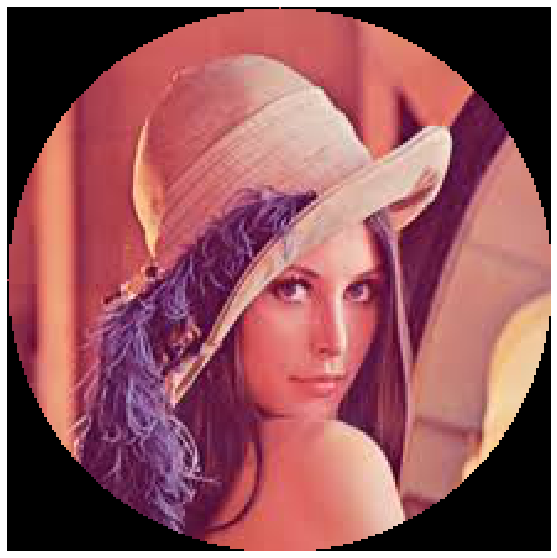

(<matplotlib.image.AxesImage at 0x7ff452da6080>,
 (-0.5, 219.5, 219.5, -0.5),
 None)

In [16]:
lena_image = Image.open('./Images/lena.jpg')
lena_image = np.array(lena_image)
print(lena_image[0, 40])
lx, ly, _ = lena_image.shape
X, Y = np.ogrid[0:lx, 0:ly]
mask = (X - lx / 2) ** 2 + (Y - ly / 2) ** 2 > lx * ly / 4
lena_image[mask,:] = 0
plt.figure(figsize=(10,10))
plt.imshow(lena_image), plt.axis('off'), plt.show()


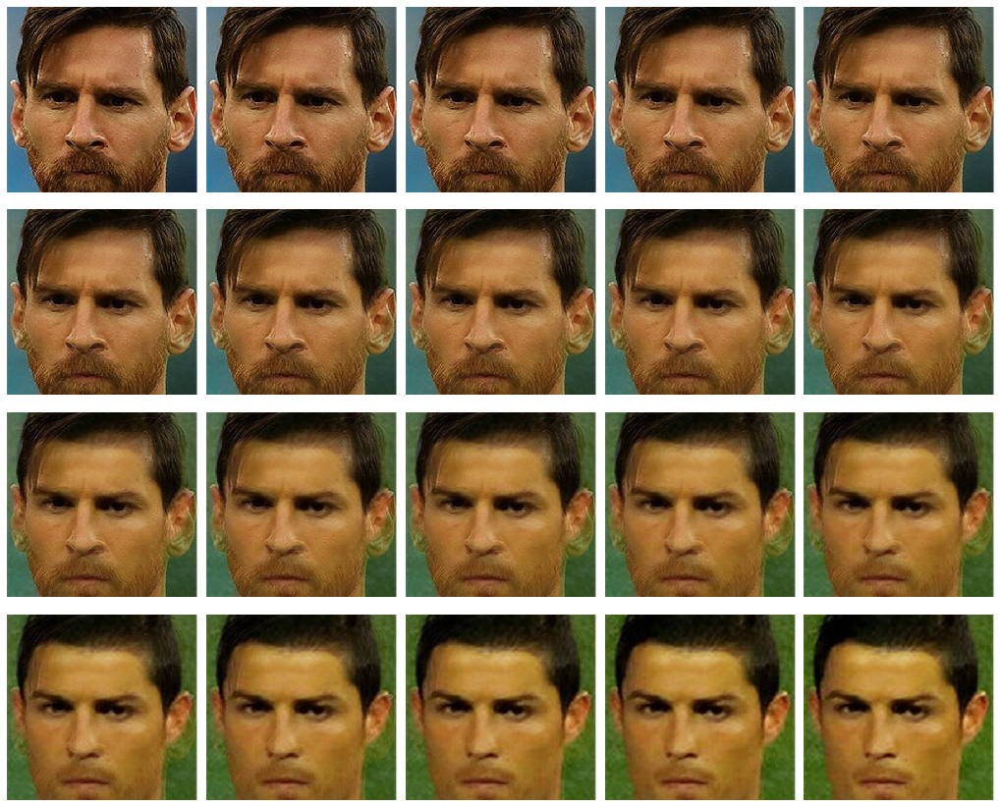

In [17]:
image_messi = mpimg.imread("./Images/messi.jpg") / 255 
image_ronaldo = mpimg.imread("./Images/ronaldo.jpg") / 255
i = 1
plt.figure(figsize=(18, 15))
for alpha in np.linspace(0,1,20):
  plt.subplot(4,5,i)
  plt.imshow((1-alpha)*image_messi + alpha*image_ronaldo)
  plt.axis('off')
  i+=1
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

### Image manipulations with PIL

In [18]:
image = Image.open("./Images/parrot.png") 
print(image.width, image.height, image.mode, image.format) 

453 340 RGB PNG


### Cropping an image

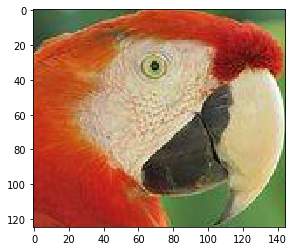

In [19]:
image_c = image.crop((175,75,320,200)) 
plt.imshow(image_c)

### Resizing an image

107 105


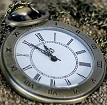

In [20]:
image = Image.open("./Images/clock.jpg")
print(image.width, image.height)
image

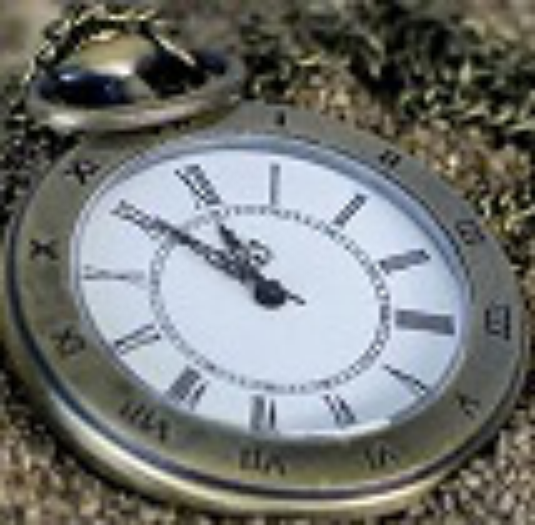

In [21]:
image_large = image.resize((image.width*5, image.height*5), Image.BILINEAR) 
image_large

720 540


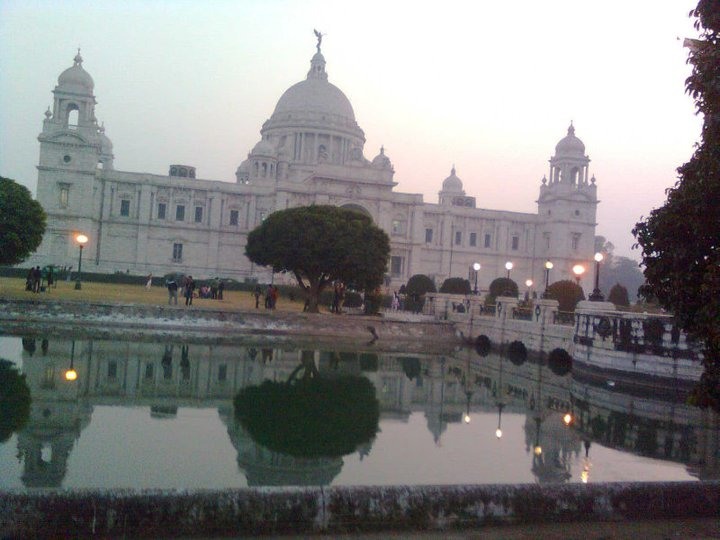

In [22]:
image = Image.open("./Images/victoria_memorial.png")
print(image.width, image.height)
image

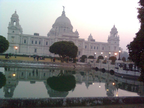

In [23]:
image_small = image.resize((image.width//5, image.height//5), Image.ANTIALIAS)
image_small

### Negating an image

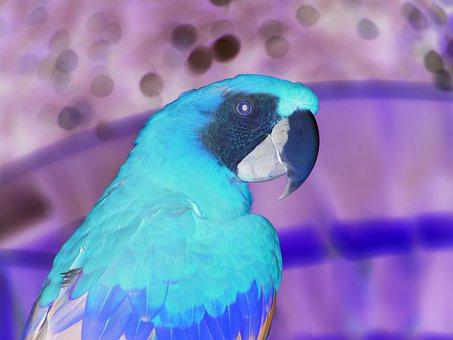

In [24]:
image = Image.open("./Images/parrot.png")
image_t = image.point(lambda x: 255 - x)
image_t

### Converting an image into grayscale

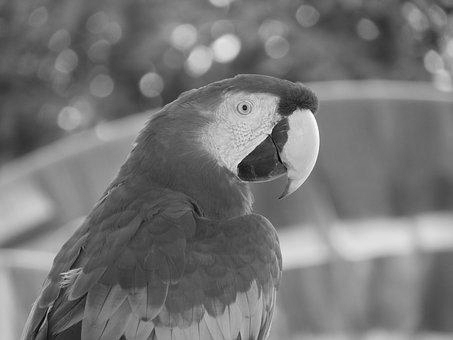

In [25]:
image_gray = image.convert('L')
image_gray

### Log transformation

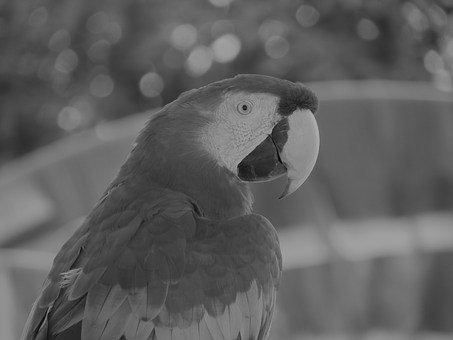

In [26]:
image = image_gray.point(lambda x: 255*np.log(1+x/255))
image

### Power-law transformation

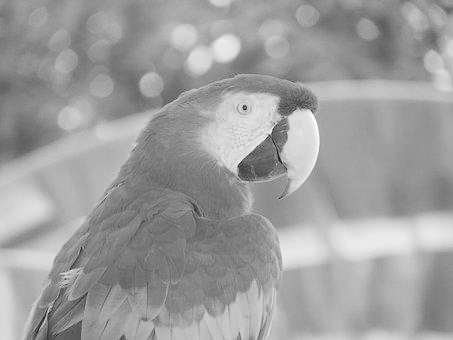

In [27]:
image = image_gray.point(lambda x: 255*(x/255)**0.6)
image

### Reflecting an image

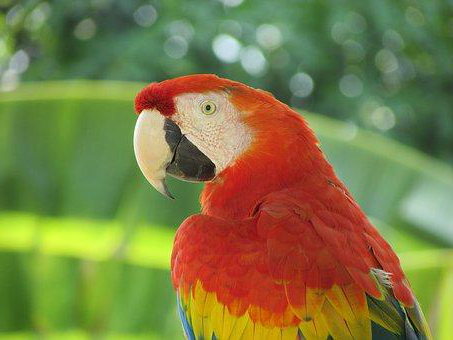

In [28]:
image = Image.open("./Images/parrot.png")
image_result = image.transpose(Image.FLIP_LEFT_RIGHT)
image_result

### Rotating an image

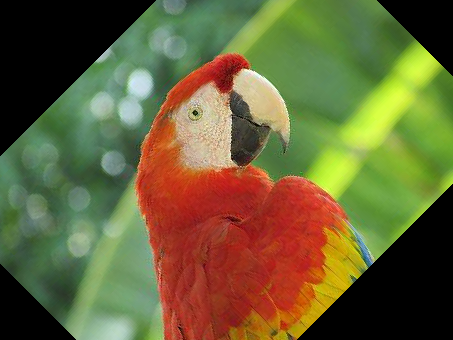

In [29]:
image_rotate_45 = image.rotate(45)
image_rotate_45

### Applying an Affine transformation on an image

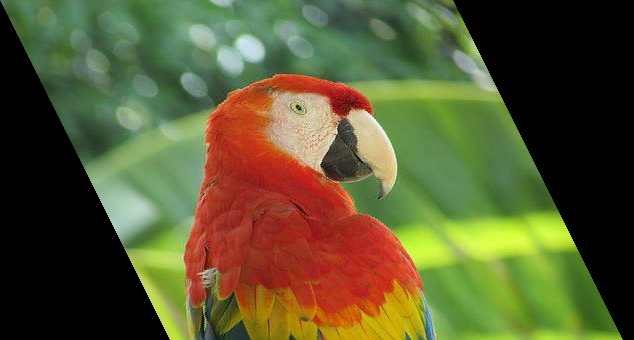

In [30]:
image = Image.open("./Images/parrot.png")
image_trans = image.transform((int(1.4*image.width), image.height), Image.AFFINE, data=(1,-0.5,0,0,1,0))
image_trans

### Perspective transformation

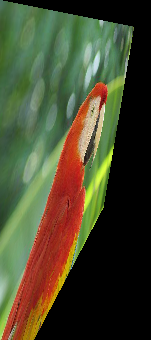

In [31]:
params = [1, 0.1, 0, -0.1, 0.5, 0, -0.005, -0.001]
image_trans = image.transform((image.width//3, image.height), Image.PERSPECTIVE, params, Image.BICUBIC)
image_trans

### Changing pixel values of an image

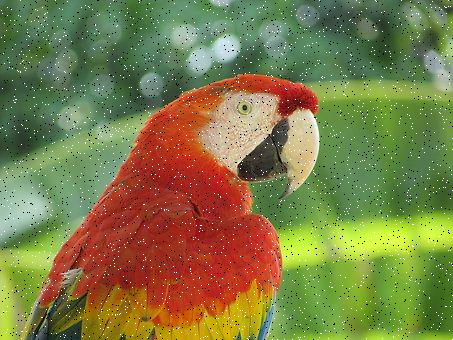

In [32]:

image1 = image.copy() 
n = 5000
x, y = np.random.randint(0, image.width, n), np.random.randint(0, image.height,n)
for (x,y) in zip(x,y):
    image1.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) 
image1

### Drawing on an image

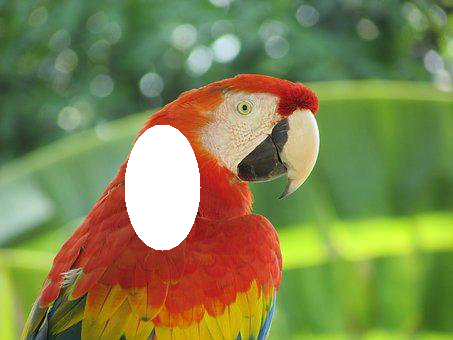

In [33]:
image = Image.open("./Images/parrot.png")
draw = ImageDraw.Draw(image)
draw.ellipse((125, 125, 200, 250), fill=(255,255,255,128))
del draw
image

### Drawing text on an image

In [0]:
!unzip fishfryrochesterny_arial.zip

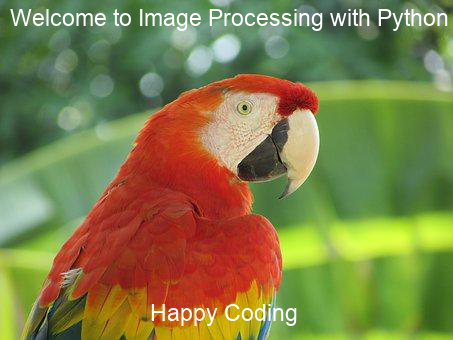

In [35]:
import matplotlib.font_manager as fm
image = Image.open("./Images/parrot.png")
draw = ImageDraw.Draw(image)
font = ImageFont.truetype("arial.ttf", 23)
draw.text((10, 5), "Welcome to Image Processing with Python", font=font)
draw.text((150,300), "Happy Coding", font=font)
del draw
image

### Creating a thumbnail

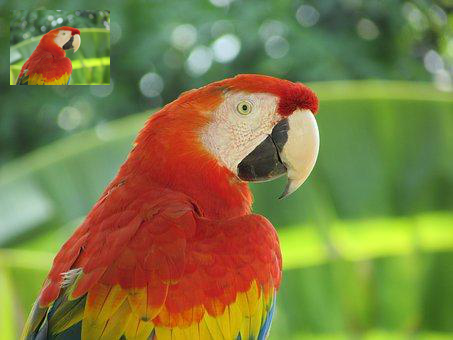

In [36]:
image = Image.open("./Images/parrot.png")
image_thumbnail = image.copy()
image_thumbnail.thumbnail((100,100)) 
image.paste(image_thumbnail, (10,10))
image.save("./Images/parrot_thumb.jpg")
image

### Computing the basic statistics of an image

In [37]:
s = Stat(image)
print(s.extrema)
print(s.count)
print(s.mean)
print(s.median)
print(s.stddev)

[(0, 255), (0, 255), (0, 253)]
[154020, 154020, 154020]
[127.6216919880535, 124.87110115569406, 67.89499415660303]
[121, 130, 62]
[47.68779592915661, 52.249097463622974, 39.91251964471368]


### Plotting the histograms of pixel values for the RGB channels of an image

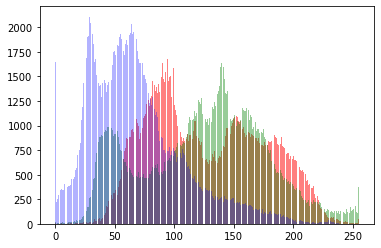

In [38]:
pl = image.histogram()
plt.bar(range(256), pl[:256], color='r', alpha=0.5)
plt.bar(range(256), pl[256:2*256], color='g', alpha=0.4)
plt.bar(range(256), pl[2*256:], color='b', alpha=0.3)
plt.show()

### Separating the RGB channels of an image

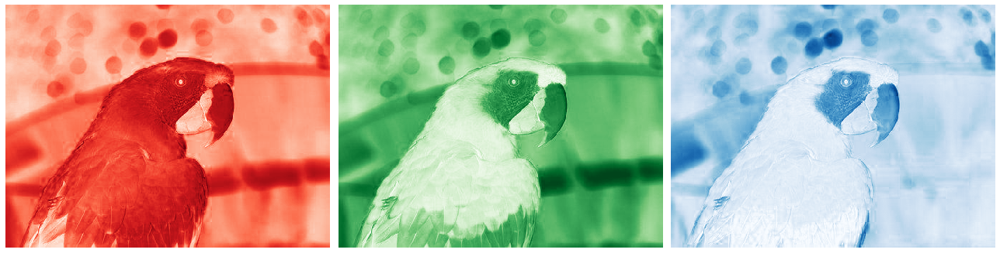

In [39]:
image = Image.open("./Images/parrot.png")
ch_r, ch_g, ch_b = image.split()
plt.figure(figsize=(18,6))
plt.subplot(1,3,1); plt.imshow(ch_r, cmap=plt.cm.Reds); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(ch_g, cmap=plt.cm.Greens); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(ch_b, cmap=plt.cm.Blues); plt.axis('off')
plt.tight_layout()
plt.show()

### Combining multiple channels of an image

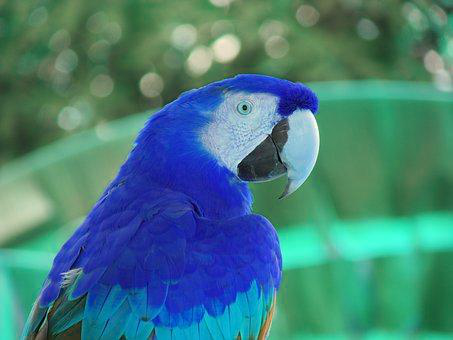

In [40]:
image = Image.merge('RGB', (ch_b, ch_g, ch_r))
image

### α-blending two images

In [0]:
image1 = Image.open("./Images/parrot.png")
image2 = Image.open("./Images/hill.png")
image1 = image1.convert('RGBA')
image2 = image2.resize((image1.width, image1.height), Image.BILINEAR) 
image = Image.blend(image1, image2, alpha=0.5)

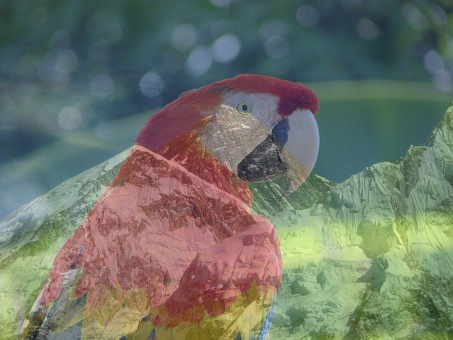

In [42]:
image

### Superimposing two images

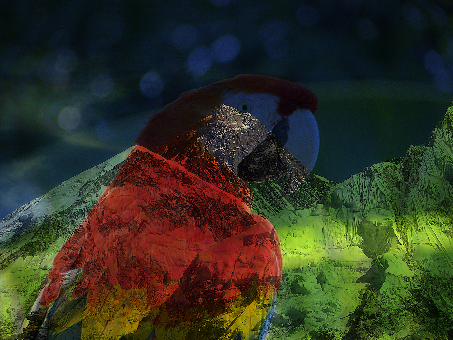

In [43]:
image1 = Image.open("./Images/parrot.png")
image2 = Image.open("./Images/hill.png").convert('RGB').resize((image1.width, image1.height))
image = multiply(image1, image2)
image

### Adding two images

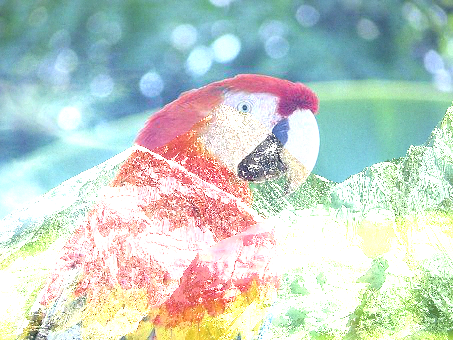

In [44]:
image = add(image1, image2)
image

### Computing the difference between two images

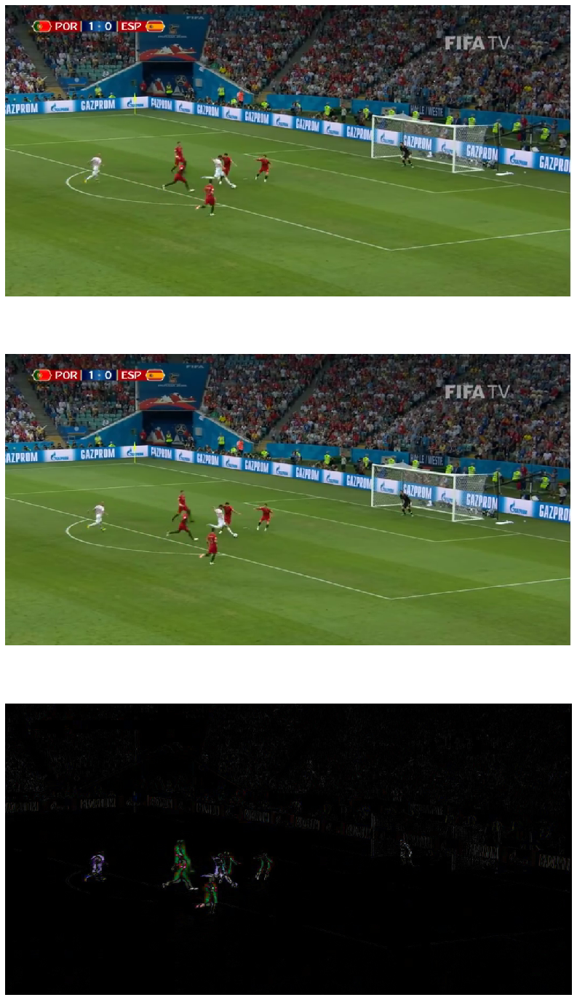

In [45]:
image1 = Image.open("./Images/goal1.png") 
image2 = Image.open("./Images/goal2.png")
image = difference(image1, image2)
plt.figure(figsize=(20,25))
image.save("./Images/goal_diff.png")
plt.subplot(311)
plt.imshow(image1)
plt.axis('off')
plt.subplot(312)
plt.imshow(image2)
plt.axis('off')
plt.subplot(313)
plt.imshow(image), plt.axis('off')
plt.show()


### Inverse warping and geometric transformation using the warp() function

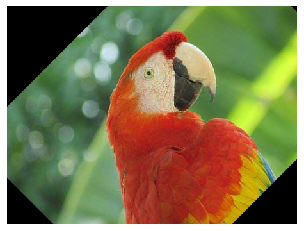

(<matplotlib.image.AxesImage at 0x7ff452433390>,
 (-0.5, 452.5, 339.5, -0.5),
 None)

In [46]:
image = imread("./Images/parrot.png")
transform = SimilarityTransform(scale=0.9,rotation=np.pi/4,translation=(image.shape[0]/2, -100))
warped = warp(image, transform)
plt.imshow(warped), plt.axis('off'), plt.show()

### Applying the swirl transform

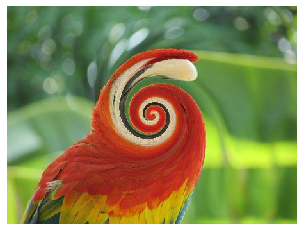

In [47]:
image = imread("./Images/parrot.png")
swirled = swirl(image, rotation=0, strength=15, radius=200)
plt.imshow(swirled)
plt.axis('off')
plt.show()

### Adding random Gaussian noise to images

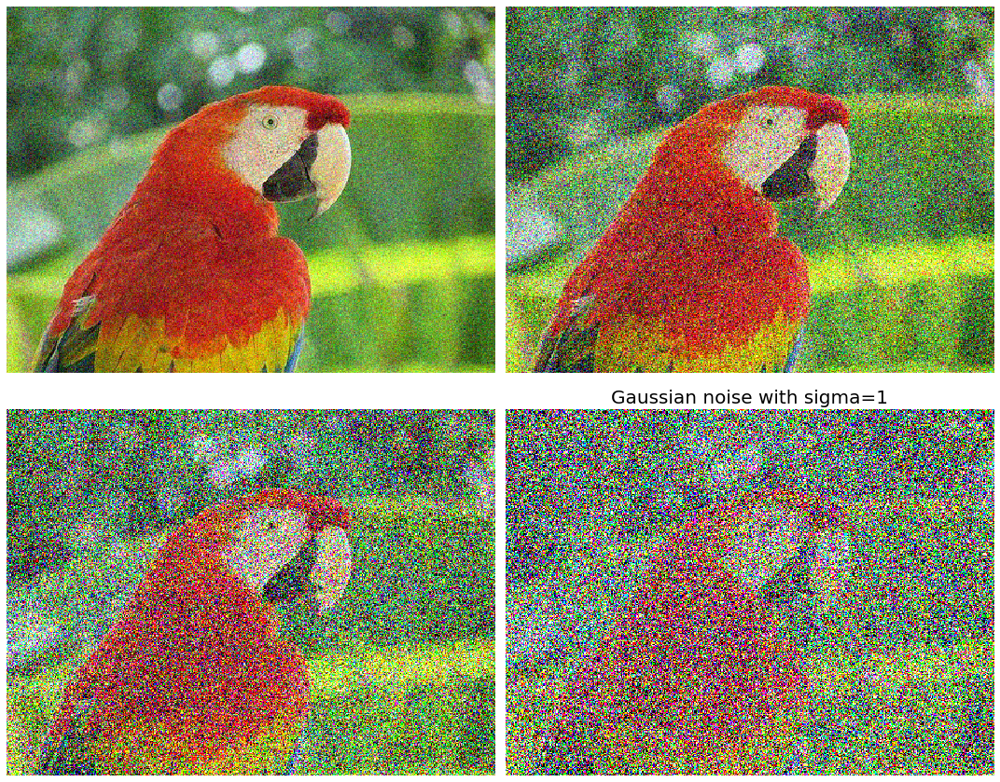

In [48]:
image = img_as_float(imread("./Images/parrot.png"))
plt.figure(figsize=(15,12))
sigmas = [0.1, 0.25, 0.5, 1]
for i in range(4):
    noisy = random_noise(image, var=sigmas[i]**2)
    plt.subplot(2,2,i+1)
    plt.imshow(noisy)
    plt.axis('off')
plt.title('Gaussian noise with sigma=' + str(sigmas[i]), size=20)
plt.tight_layout()
plt.show()

### Drawing contour lines for an image

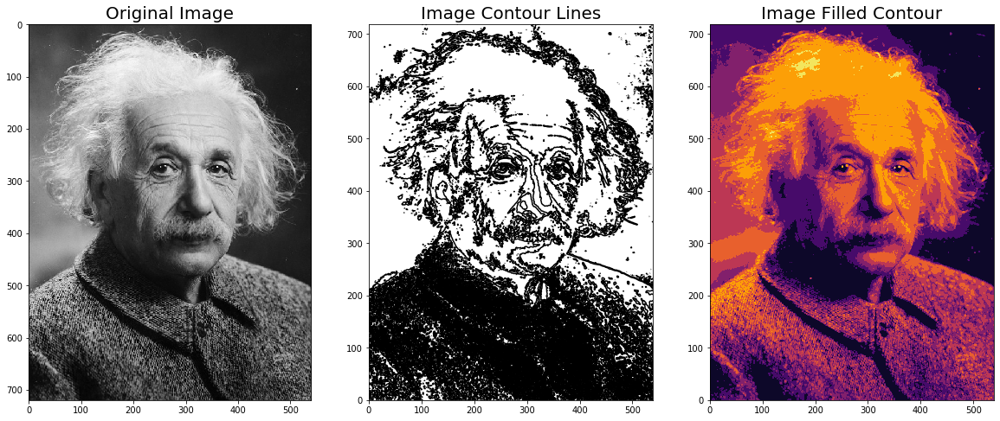

In [49]:
image = color.rgb2gray(imread("./Images/einstein.jpg")) 
plt.figure(figsize=(20,8))
plt.subplot(131), plt.imshow(image, cmap='gray'), plt.title('Original Image', size=20)
plt.subplot(132), plt.contour(np.flipud(image), colors='k',
levels=np.logspace(-15, 15, 100))
plt.title('Image Contour Lines', size=20)
plt.subplot(133), plt.title('Image Filled Contour', size=20),
plt.contourf(np.flipud(image), cmap='inferno')
plt.show()